## Gaussian Process 

* Import from EFPPO

In [1]:
import functools as ft
import pathlib

import ipdb
import jax
import jax.random as jr
import jax.numpy as jnp

import matplotlib.pyplot as plt
import numpy as np
import typer
from loguru import logger

import efppo.run_config.f16
from efppo.task.f16 import F16GCASFloorCeil
from efppo.task.f16_safeguarded import MORELLI_BOUNDS, F16Safeguarded

from efppo.rl.collector import RolloutOutput, collect_single_mode
from efppo.rl.efppo_inner import EFPPOInner
from efppo.rl.rootfind_policy import Rootfinder, RootfindPolicy
from efppo.task.plotter import Plotter
from efppo.utils.ckpt_utils import get_run_dir_from_ckpt_path, load_ckpt_ez
from efppo.utils.jax_utils import jax2np, jax_vmap, merge01
from efppo.utils.logging import set_logger_format
from efppo.utils.path_utils import mkdir

from gp_cbf.src.f16 import F16GCASFloorCeilDisturbed

from itertools import product




2024-07-02 14:44:53.001308: W external/xla/xla/service/gpu/nvptx_compiler.cc:763] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.5.40). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


### Define function

In [2]:
def generate_rollouts(task, alg, rootfind_pol, x0s = [],z0s = [], T = 512) -> RolloutOutput:
    # Roll out episode length
    rollout_T = T
 
    ## Collect trajectory
    collect_fn = ft.partial(
            collect_single_mode,
            task,
            get_pol=rootfind_pol,
            disc_gamma=alg.disc_gamma,
            z_min=alg.z_min,
            z_max=alg.z_max,
            rollout_T=rollout_T,
        )
        
    vmap_fn = jax.jit(jax_vmap(collect_fn, rep=1))
    bb_rollout: RolloutOutput = jax2np(vmap_fn(x0s, z0s)) 
    return bb_rollout

def plot_rollouts(plotter, bb_rollout, fig_name=None):
    ###############################3
    # Plot. 
    figsize = np.array([2.8, 2.2])
    fig, ax = plt.subplots(figsize=figsize, dpi=500)
    fig = plotter.plot_traj(bb_rollout.Tp1_state, multicolor=True, ax=ax)
    if fig_name is None:
        fig_name = 'fig.jpg' 
    fig_path = './' + fig_name
    fig.savefig(fig_path, bbox_inches="tight")
    plt.show()
    plt.close(fig)

def get_initial_states(task, alg, num = 1):    
    # Plot configuration
    bb_X, bb_Y, bb_x0 = jax2np(task.grid_contour())
    b1, b2 = bb_X.shape
    bb_z0 = np.full((b1, b2), alg.z_max)    
    print(bb_x0.shape, bb_z0.shape)

    # Plot configuration
    ids = np.random.choice(b1 * b2, num, replace=False)
    idxs = list(map(lambda idx:  (int(idx/b2), idx % b2), ids))
    rows, cols = zip(*idxs)
    bb_x0 = bb_x0[rows, cols]
    bb_z0 = bb_z0[rows, cols]
    print(bb_x0.shape, bb_z0.shape)
    return bb_x0, bb_z0


* Set the ckpt path of the policy model

In [3]:
ckpt_path = pathlib.Path("/home/zwc662/Workspace/MIT-REALM/efppo/runs/F16GCASFloorCeil_inner/0001-run2/ckpts/09999999/default/")
run_dir = get_run_dir_from_ckpt_path(ckpt_path)

* Testing the undistrubed model

In [4]:
task = F16GCASFloorCeilDisturbed()
task.dt /= 2
plotter = Plotter(task)
    

alg_cfg, collect_cfg = efppo.run_config.f16.get()
alg: EFPPOInner = EFPPOInner.create(jr.PRNGKey(0), task, alg_cfg)


ckpt_dict = load_ckpt_ez(ckpt_path, {"alg": alg})
#alg = ckpt_dict["alg"]

rootfind = Rootfinder(alg.Vh.apply, alg.z_min, alg.z_max, h_tgt=-0.70)
rootfind_pol = RootfindPolicy(alg.policy.apply, rootfind)
 

(64, 64, 17) (64, 64)
(2, 17) (2,)
step


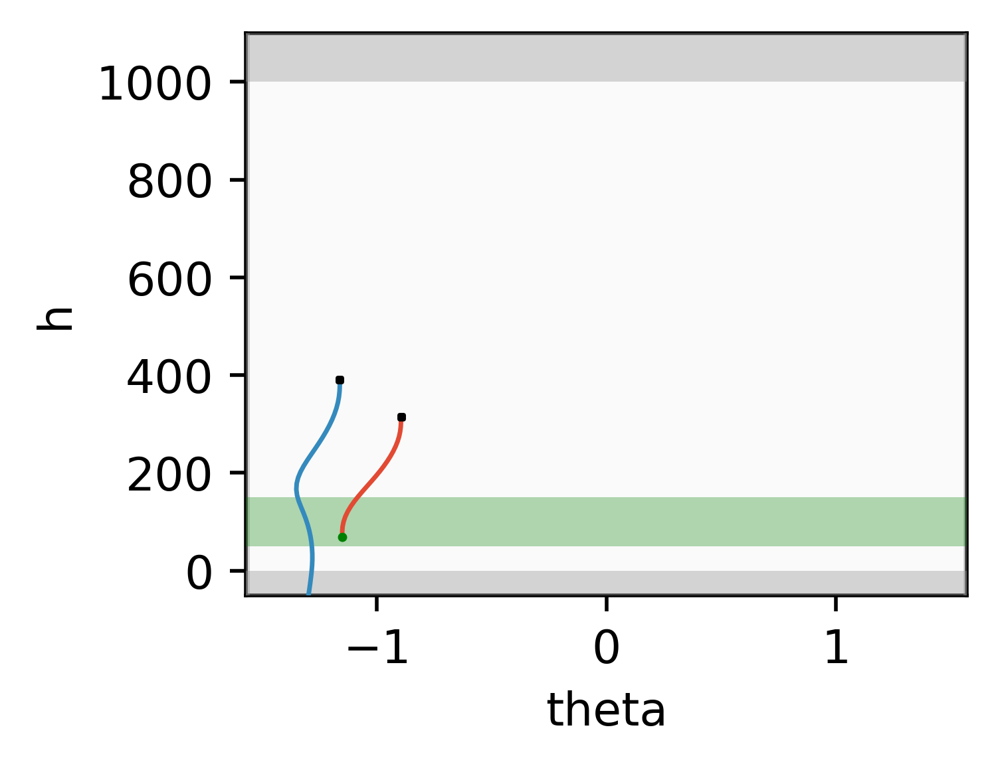

In [5]:
x0s, z0s = get_initial_states(task, alg, num = 2)
rollouts = generate_rollouts(task, alg, rootfind_pol, x0s, z0s)
plot_rollouts(plotter, bb_rollout=rollouts, fig_name='sim_trajs.jpg')

### Create a disturbed model

A time variant Gaussian noise disturbance is added to the $\theta$ state variable. The mean and std of the noise are proportional to the $\theta$ of current state $x_t$. 

step


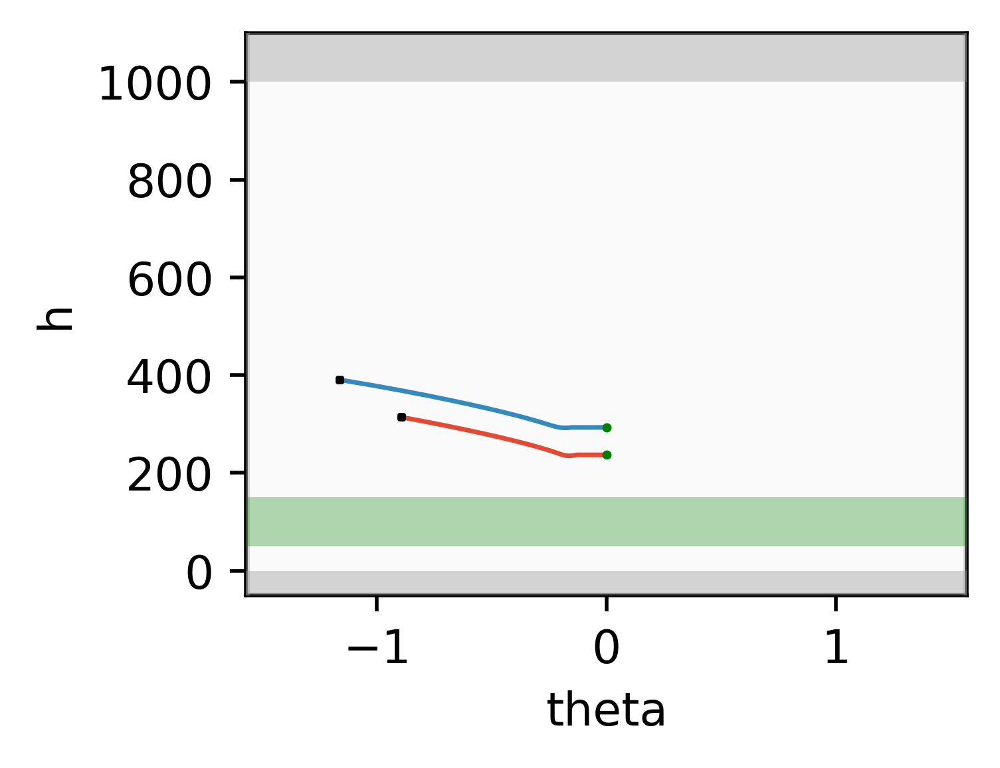

In [6]:
dist_task = F16GCASFloorCeilDisturbed()
dist_task.dt /= 2
dist_task.err_fn = lambda state_var: 0.1 * state_var + 0.1 * state_var * np.random.normal() 

dist_rollouts = generate_rollouts(dist_task, alg, rootfind_pol, x0s, z0s)
plot_rollouts(plotter, bb_rollout=dist_rollouts, fig_name='dist_trajs.jpg')

* Simulate from every measured state for T=512 steps

(2, 513, 17)
(2, 513)
step


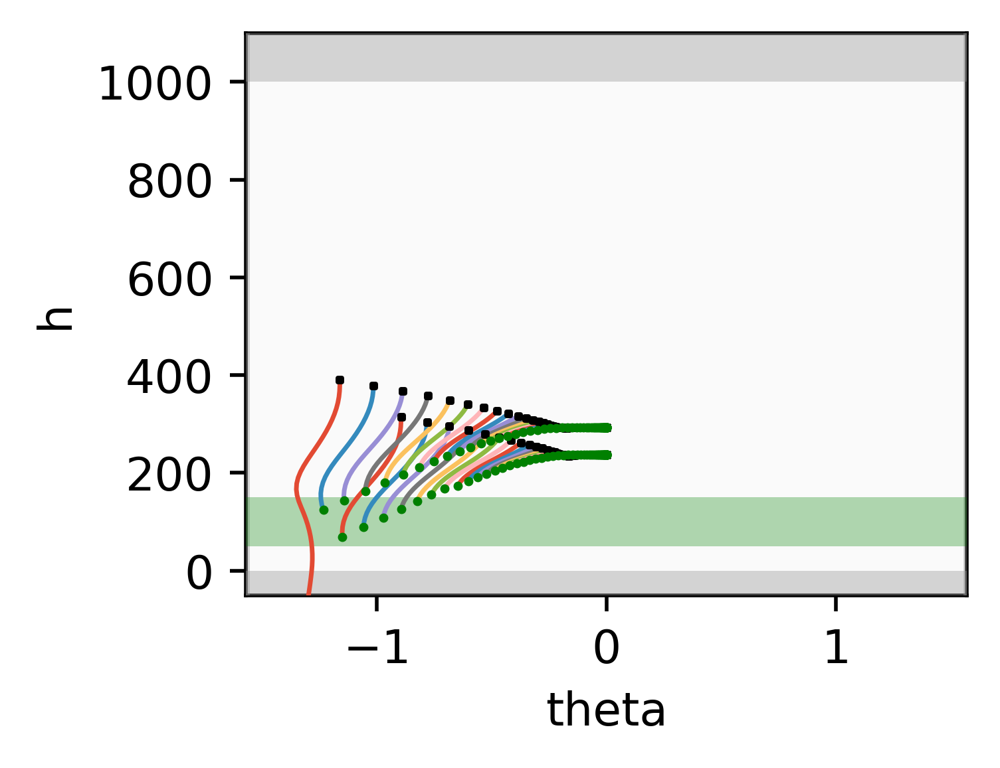

In [7]:
print(dist_rollouts.Tp1_state.shape)
print(dist_rollouts.Tp1_z.shape)
xms = dist_rollouts.Tp1_state.reshape(-1, 17)
zms = dist_rollouts.Tp1_z.reshape(-1)
bb_sims = generate_rollouts(task, alg, rootfind_pol, xms, zms, T = 512)
plot_rollouts(plotter, bb_rollout=bb_sims, fig_name='dist_sim_trajs.jpg')
   

## GP Regression

This notebook demonstrate how to fit a GP regression model with the difference between simulated and measured state errors

In [8]:
# Enable Float64 for more stable matrix inversions.
from jax import config

#config.update("jax_enable_x64", True)

from jax import jit
import jax.numpy as jnp
import jax.random as jr
from jaxtyping import install_import_hook
import optax as ox
#from docs.examples.utils import clean_legend

with install_import_hook("gpjax", "beartype.beartype"):
    import gpjax as gpx

key = jr.key(123)
 
 

/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Dataset

Create a dataset of disturbance errors.
From each step $t$ to the next step $t+1$, the measured states are $x_t$ and $x_{t+1}$. 
However, the simulated next state is $\hat{x}_{t+1}$.
Now build a dataset $D=\{x_t, y_t = \hat{x}_{t+1} - \hat{x}_{t+1}\}$

In [9]:
# Simulated states xs shape is (nx, T, dx) <= nx: number of measured states, T: simulation length: dx: dim of each state 
# Get 1st simulated step state for each measured states. Ignore the last state because there is no next state
#xs = bb_sims.Tp1_state[:, 1, :]
xs = jnp.concatenate((bb_sims.Tp1_state[:500, 1, :], bb_sims.Tp1_state[-513:-13, 1, :]), axis=0) 
print(bb_sims.Tp1_state.shape, xs.dtype, xs.shape) 
# Measured states xms shape is (num_traj, T, dx) <= num_traj: num of trajectories, T: simulation length, dx: dim of each state
# Flatten the trajectories. Ignore the last state because there is no next state
print(dist_rollouts.Tp1_state.dtype, dist_rollouts.Tp1_state.shape) 
xms = jnp.concatenate((dist_rollouts.Tp1_state[0][:500], dist_rollouts.Tp1_state[1][:500]), axis=0)  
zms = jnp.concatenate((dist_rollouts.Tp1_z[0][:500], dist_rollouts.Tp1_z[1][:500]), axis = 0)
print(dist_rollouts.Tp1_state[0][:500].shape, dist_rollouts.Tp1_state[1][:500].shape)
cur_xms = jnp.concatenate((dist_rollouts.Tp1_state[0][:500], dist_rollouts.Tp1_state[1][:500]), axis=0) 
nxt_xms = jnp.concatenate((dist_rollouts.Tp1_state[0][1:501], dist_rollouts.Tp1_state[1][1:501]), axis=0) 

print(cur_xms.shape, nxt_xms.shape)


print(jnp.concatenate((dist_rollouts.Tp1_state[0], dist_rollouts.Tp1_state[1]), axis=0)[:10, 0], bb_sims.Tp1_state[:, 0, :][:10, 0])

#assert (bb_sims.Tp1_state[:, 0, :] == jnp.concatenate((xms[0], xms[1]), axis=0)).all()

assert xs.shape[0] == cur_xms.shape[0] == nxt_xms.shape[0]

X = cur_xms[:].astype(jnp.float32)
y = nxt_xms[:,F16Safeguarded.THETA:F16Safeguarded.THETA+1] - xs[:, F16Safeguarded.THETA: F16Safeguarded.THETA+1].astype(jnp.float32)


print(X.dtype, X.shape)
print(y.dtype, y.shape, y)

D = gpx.Dataset(X, y)

(1026, 513, 17) float32 (1000, 17)
float32 (2, 513, 17)
(500, 17) (500, 17)
(1000, 17) (1000, 17)
[502.08966 502.72165 503.2553  503.67294 503.97028 504.17596 504.33432
 504.44705 504.53644 504.66373] [502.08966 502.72165 503.2553  503.67294 503.97028 504.17596 504.33432
 504.44705 504.53644 504.66373]
float32 (1000, 17)
float32 (1000, 1) [[1.13105953e-01]
 [9.89603996e-02]
 [8.68006945e-02]
 [7.64190555e-02]
 [6.76046908e-02]
 [6.01494610e-02]
 [5.38663268e-02]
 [4.85939980e-02]
 [4.41425741e-02]
 [4.03967202e-02]
 [3.72779071e-02]
 [3.47081870e-02]
 [3.26121002e-02]
 [3.09041589e-02]
 [2.94924676e-02]
 [2.82942802e-02]
 [2.72369087e-02]
 [2.62583643e-02]
 [2.53067166e-02]
 [2.43376195e-02]
 [2.33177394e-02]
 [2.22265720e-02]
 [2.10549086e-02]
 [1.98026896e-02]
 [1.84761435e-02]
 [1.61423087e-02]
 [1.41032636e-02]
 [1.23217851e-02]
 [1.07653290e-02]
 [9.40549374e-03]
 [8.21742043e-03]
 [7.17942044e-03]
 [6.27253950e-03]
 [5.48021495e-03]
 [4.78797033e-03]
 [4.18316945e-03]
 [3.6547649

/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jaxtyping/_decorator.py:457: UserWarning: X is not of type float64. Got X.dtype=float32. This may lead to numerical instability. 
  out = fn(*args, **kwargs)
/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jaxtyping/_decorator.py:457: UserWarning: y is not of type float64.Got y.dtype=float32. This may lead to numerical instability.
  out = fn(*args, **kwargs)


### Constructing the prior 

* Define GP prior that is invariant w.r.t $x_t$. After creating the prior, it can be added to the low fidelity model to compensate the $\theta$. Need to define a new adaptive task to simulate the trajectories.

In [10]:
kernel = gpx.kernels.RBF()
meanf = gpx.mean_functions.Zero()
prior = gpx.gps.Prior(mean_function=meanf, kernel=kernel)


#@jax.jit
#def get_dist_state(state): 
#    prior_dist = prior.predict(state.reshape(1, -1))
#    dist_theta = prior_dist.sample(seed=key, sample_shape=(1, 1))
#    dist_state = state.at[F16Safeguarded.THETA].add(jnp.asarray(dist_theta)[0, 0])
#    return dist_state 
       
#ada_task = F16GCASFloorCeilDisturbed()
#ada_task.dt /= 2
#ada_task.get_dist_state = get_dist_state
  
#bb_sims = generate_rollouts(ada_task, alg, rootfind_pol, xms, zms, T = 512)
#plot_rollouts(plotter, bb_rollout=bb_sims, fig_name='adv_sim_trajs.jpg')



### Contructing the posterior and optimize the parameters

* Get posterior from likelihood and prior. 
* Build marginal negative log-likelihood PyTree with the computed posterior. 
* JIT compute the negative log-likelihood. 
* Define optimizer to minimize the negative log-likelihood.



In [11]:
# Define likelihood
likelihood = gpx.likelihoods.Gaussian(num_datapoints=D.n)

posterior = prior * likelihood
 
negative_mll = gpx.objectives.ConjugateMLL(negative=True)
negative_mll = jit(negative_mll)

opt_posterior, history = gpx.fit_scipy(
    model=posterior,
    objective=negative_mll,
    train_data=D,
)

 

         Current function value: 34178.703125
         Iterations: 1
         Function evaluations: 144
         Gradient evaluations: 136


/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/scipy/_lib/array_api_compat/common/_aliases.py:235: RuntimeWarning: overflow encountered in cast
  return x.astype(dtype=dtype, copy=copy)
/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/scipy/optimize/_minimize.py:708: OptimizeWarning: Desired error not necessarily achieved due to precision loss.
  res = _minimize_bfgs(fun, x0, args, jac, callback, **options)


### Load the error model back to F16

In [21]:
#@jax.jit
def get_dist_state(state): 
    #jax.debug.print('state: {}', state)
    latent_dist = opt_posterior.predict(state.reshape(1, -1), train_data=D)
    posterior_dist = opt_posterior.likelihood(latent_dist)
    dist_theta = posterior_dist.mean()
    dist_state = state.at[F16Safeguarded.THETA].add(jnp.asarray(dist_theta)[0])
    #jax.debug.print('dist_state: {}', state)
    return dist_state

In [22]:

ada_task = F16GCASFloorCeilDisturbed()
ada_task.dt /= 2 
ada_task.get_dist_state = get_dist_state

bb_sims = generate_rollouts(ada_task, alg, rootfind_pol, xms, zms, T = 512)
plot_rollouts(plotter, bb_rollout=bb_sims, fig_name='ada_sim_trajs.jpg')


step
dist_theta: [0.05267341]
dist_theta: [0.04625851]
dist_theta: [0.04076388]
dist_theta: [0.03608733]
dist_theta: [0.03212459]
dist_theta: [0.02878023]
dist_theta: [0.02597096]
dist_theta: [0.02359718]
dist_theta: [0.02159845]
dist_theta: [0.01993356]
dist_theta: [0.01856131]
dist_theta: [0.0174417]
dist_theta: [0.01652922]
dist_theta: [0.01577488]
dist_theta: [0.01513452]
dist_theta: [0.01456936]
dist_theta: [0.01404626]
dist_theta: [0.0135375]
dist_theta: [0.01301935]
dist_theta: [0.01247402]
dist_theta: [0.01189053]
dist_theta: [0.01126396]
dist_theta: [0.01059427]
dist_theta: [0.00988478]
dist_theta: [0.00131157]
dist_theta: [0.00117382]
dist_theta: [0.00105295]
dist_theta: [0.00094699]
dist_theta: [0.00085416]
dist_theta: [0.00077289]
dist_theta: [0.00070184]
dist_theta: [0.00063961]
dist_theta: [0.00058528]
dist_theta: [0.0005378]
dist_theta: [0.00049628]
dist_theta: [0.00046003]
dist_theta: [0.00042826]
dist_theta: [0.00040054]
dist_theta: [0.00037632]
dist_theta: [0.00035524

ERROR:jax._src.debugging:jax.debug.callback failed
Traceback (most recent call last):
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 91, in debug_callback_impl
    callback(*args)
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 253, in _flat_callback
    callback(*args, **kwargs)
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 274, in _format_print_callback
    sys.stdout.write(fmt.format(*args, **kwargs) + "\n")
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/array.py", line 296, in __format__
    return format(self._value, format_spec)
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 1588, in _array_str_implementation
    return array2string(a, max_line_width, precision, suppress_small, ' ', "")
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-

dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
dist_theta: [4.278074e-06]
d

E0702 14:52:07.550351 3739222 pjrt_stream_executor_client.cc:2985] Execution of replica 0 failed: INTERNAL: CustomCall failed: CpuCallback error: Traceback (most recent call last):
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/runpy.py", line 196, in _run_module_as_main
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/runpy.py", line 86, in _run_code
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 739, in start
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 199, in start
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
  File "/home/zwc662/anaconda3/envs/cbf/lib/pytho

XlaRuntimeError: INTERNAL: CustomCall failed: CpuCallback error: Traceback (most recent call last):
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/runpy.py", line 196, in _run_module_as_main
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/runpy.py", line 86, in _run_code
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 739, in start
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 199, in start
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/nest_asyncio.py", line 133, in _run_once
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/asyncio/events.py", line 80, in _run
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 534, in process_one
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 362, in execute_request
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 778, in execute_request
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 449, in do_execute
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 549, in run_cell
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3075, in run_cell
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3130, in _run_cell
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3334, in run_cell_async
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3517, in run_ast_nodes
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3577, in run_code
  File "/tmp/ipykernel_3739222/2812221829.py", line 5, in <module>
  File "/tmp/ipykernel_3739222/4015769395.py", line 17, in generate_rollouts
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/traceback_util.py", line 179, in reraise_with_filtered_traceback
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/pjit.py", line 327, in cache_miss
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/pjit.py", line 185, in _python_pjit_helper
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/core.py", line 2822, in bind
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/core.py", line 420, in bind_with_trace
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/core.py", line 909, in process_primitive
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/pjit.py", line 1636, in _pjit_call_impl
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/pjit.py", line 1615, in call_impl_cache_miss
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/pjit.py", line 1569, in _pjit_call_impl_python
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/profiler.py", line 335, in wrapper
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/interpreters/pxla.py", line 1216, in __call__
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/interpreters/mlir.py", line 2473, in _wrapped_callback
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 158, in _callback
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 94, in debug_callback_impl
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 253, in _flat_callback
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/debugging.py", line 274, in _format_print_callback
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/jax/_src/array.py", line 296, in __format__
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 1588, in _array_str_implementation
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 736, in array2string
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 515, in wrapper
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 539, in _array2string
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 472, in _get_format_function
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 411, in <lambda>
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 932, in __init__
  File "/home/zwc662/anaconda3/envs/cbf/lib/python3.10/site-packages/numpy/core/arrayprint.py", line 945, in fillFormat
KeyboardInterrupt: 

### Testing

* Generate new trajectories with the ground true disturbed dynamical model

(64, 64, 17) (64, 64)
(10, 17) (10,)
step


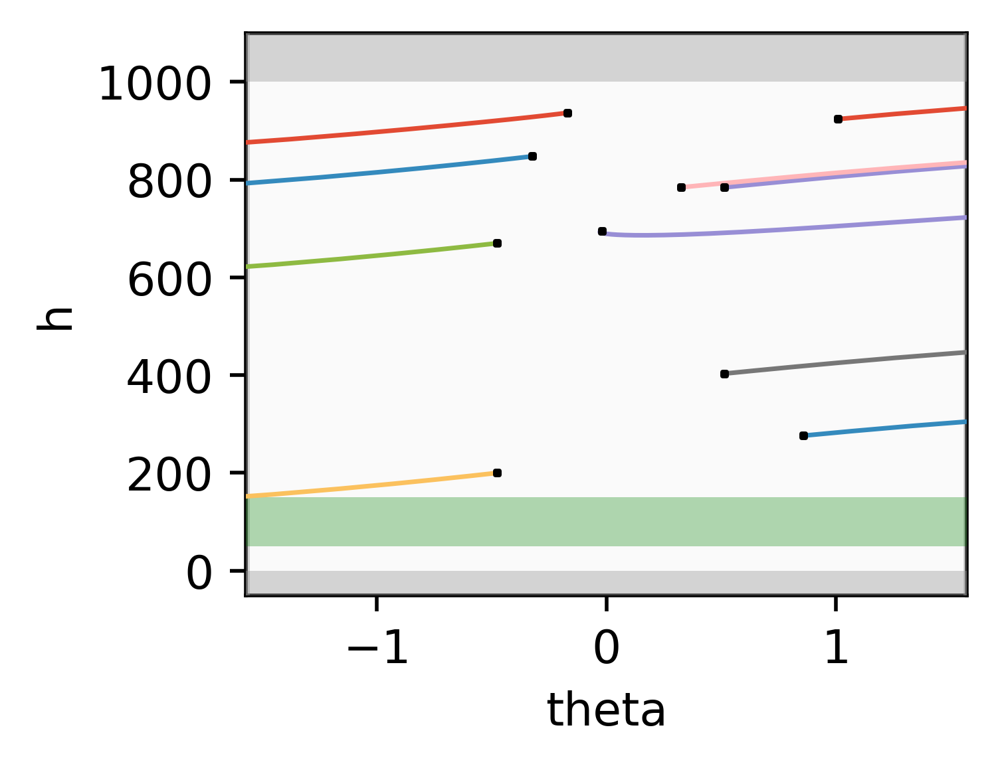

In [14]:
x0s_test, z0s_test = get_initial_states(dist_task, alg, num = 10)
dist_rollouts_test = generate_rollouts(dist_task, alg, rootfind_pol, x0s_test, z0s_test)
plot_rollouts(plotter, bb_rollout=dist_rollouts_test, fig_name='dist_trajs_test.jpg')



(10, 513, 17)
(10, 513)
step


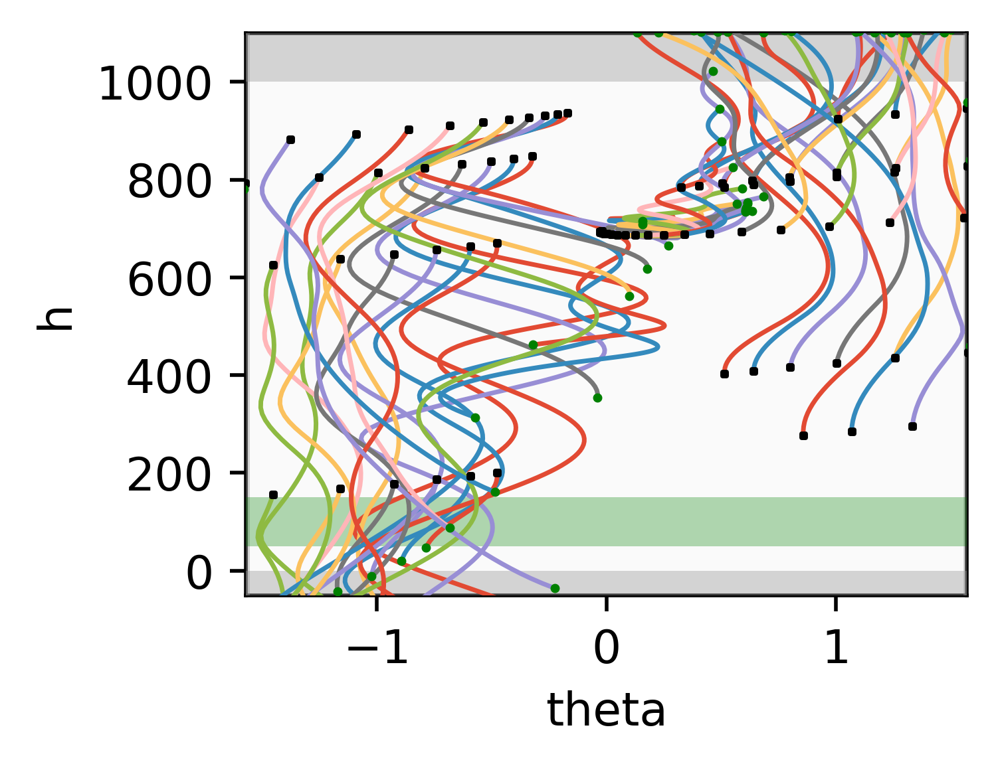

In [15]:
print(dist_rollouts_test.Tp1_state.shape)
print(dist_rollouts_test.Tp1_z.shape)
xms_test = dist_rollouts_test.Tp1_state.reshape(-1, 17)
zms_test = dist_rollouts_test.Tp1_z.reshape(-1)
bb_sims_test = generate_rollouts(task, alg, rootfind_pol, xms_test, zms_test, T = 512)
plot_rollouts(plotter, bb_rollout=bb_sims_test, fig_name='dist_sim_trajs_test.jpg')
   

step
(17,)
RolloutOutput(Tp1_state=array([[[ 5.0208966e+02,  2.6170975e-02,  0.0000000e+00, ...,
          0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
        [ 5.0140314e+02,  2.6053417e-02,  3.6070455e-04, ...,
         -2.4651767e-01,  2.4872857e-01,  0.0000000e+00],
        [ 5.0062964e+02,  2.7648879e-02,  1.6721233e-03, ...,
         -4.8305905e-01,  4.9282590e-01,  0.0000000e+00],
        ...,
        [ 4.8711374e+02,  1.4088701e-01,  1.5777451e-01, ...,
         -3.5720327e+00,  3.9318914e+00,  1.0000000e+00],
        [ 4.8711374e+02,  1.4088701e-01,  1.5777451e-01, ...,
         -3.5720327e+00,  3.9318914e+00,  1.0000000e+00],
        [ 4.8711374e+02,  1.4088701e-01,  1.5777451e-01, ...,
         -3.5720327e+00,  3.9318914e+00,  1.0000000e+00]],

       [[ 5.0140314e+02,  2.6053417e-02,  3.6070455e-04, ...,
         -2.4651767e-01,  2.4872857e-01,  0.0000000e+00],
        [ 5.0054044e+02,  2.7299335e-02,  1.6660257e-03, ...,
         -4.8305959e-01,  4.9282897e-01,  0.0000

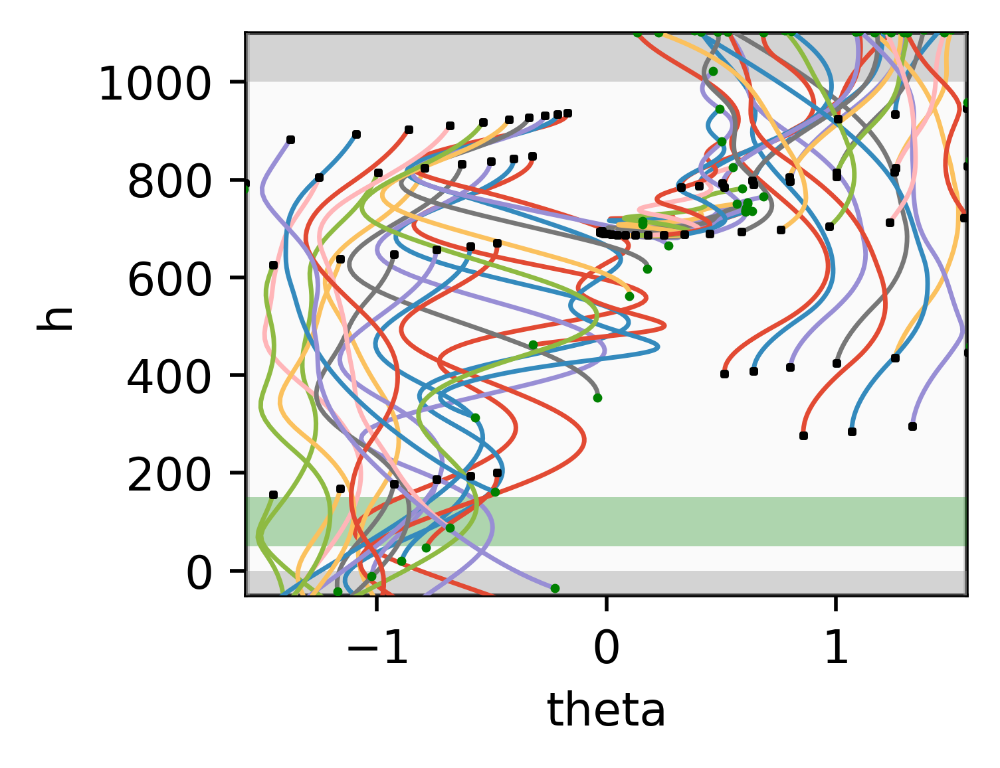

In [16]:
xms_test = dist_rollouts_test.Tp1_state.reshape(-1, 17)
zms_test = dist_rollouts_test.Tp1_z.reshape(-1)
ada_sims_test = generate_rollouts(ada_task, alg, rootfind_pol, xms_test, zms_test, T = 512)
print(ada_sims_test)
plot_rollouts(plotter, bb_rollout=ada_sims_test, fig_name='ada_sim_trajs_test.jpg')